# 1. Business Understanding

**Background**

The company is diversifying its portfolio by entering the aviation industry, aiming to purchase and operate aircraft for both commercial and private enterprises. However, since the company lacks prior experience in aviation, it needs to assess which aircraft present the lowest operational, financial, and safety risks before making investment decisions.

**Business Problem**

The key challenge is identifying which aircraft models are the least risky in terms of:

    1. Safety & Accident Rates – Which planes have the fewest incidents?

    2. Maintenance & Reliability – Which models have lower downtime and maintenance costs?

    3. Operational Costs – Which aircraft are fuel-efficient and cost-effective to operate?

    4. Market Demand & Resale Value – Which planes retain value and have strong demand in commercial/private sectors?

    5. Regulatory & Compliance Risks – Are there any models with recurring regulatory issues?

**Objective**

Analyze aircraft data to determine the 
- safest 
- most cost-efficient 
- least risky options for the company’s new aviation division. 
The findings should be translated into actionable recommendations to guide purchasing decisions.

# 2. Data Understanding

**AViation Dataset**

The Aviation dataset has 88,889 rows and 31 columns. Below is the list of columns;

    - Event.Id

     - Investigation.Type

     - Accident.Number

     - Event.Date

     - Location

     - Country

     - Latitude

     - Longitude

     - Airport.Code

     - Airport.Name

     - Injury.Severity

     - Aircraft.damage

     - Aircraft.Category

     - Registration.Number

     - Make

     - Model

     - Amateur.Built

     - Number.of.Engines

     - Engine.Type

     - FAR.Description

     - Schedule

     - Purpose.of.flight

     - Air.carrier

     - Total.Fatal.Injuries

     - Total.Serious.Injuries

     - Total.Minor.Injuries

     - Total.Uninjured

     - Weather.Condition

     - Broad.phase.of.flight

     - Report.Status

     - Publication.Date

**State_Code Dataset**

State_code dataset has 62 rows and 2 columns.

Below is he list of columns;

- US_State 
- Abbreviation

 
    Data Analysis
    


# 3.    Data Preparation

### a) Import Libraries

In [68]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy.stats as stats
import statsmodels.api as sm
import re

### b) Loading Datasets

In [69]:
#Aviation Dataset
aviation_data = pd.read_csv('Data\Aviation_Data.csv', encoding='latin1')


<>:2: SyntaxWarning: invalid escape sequence '\A'
<>:2: SyntaxWarning: invalid escape sequence '\A'
C:\Users\lenovo\AppData\Local\Temp\ipykernel_17000\1743096975.py:2: SyntaxWarning: invalid escape sequence '\A'
  aviation_data = pd.read_csv('Data\Aviation_Data.csv', encoding='latin1')
C:\Users\lenovo\AppData\Local\Temp\ipykernel_17000\1743096975.py:2: DtypeWarning: Columns (6,7,28) have mixed types. Specify dtype option on import or set low_memory=False.
  aviation_data = pd.read_csv('Data\Aviation_Data.csv', encoding='latin1')


In [70]:
# State Codes Dataset
state_codes = pd.read_csv(r'Data\USState_Codes.csv')

### c) Previewing the Datasets

In [71]:
#Aviation Row and column numbers
aviation_data.shape

(88889, 31)

In [72]:
#Aviation data columns
aviation_data.columns

Index(['Event.Id', 'Investigation.Type', 'Accident.Number', 'Event.Date',
       'Location', 'Country', 'Latitude', 'Longitude', 'Airport.Code',
       'Airport.Name', 'Injury.Severity', 'Aircraft.damage',
       'Aircraft.Category', 'Registration.Number', 'Make', 'Model',
       'Amateur.Built', 'Number.of.Engines', 'Engine.Type', 'FAR.Description',
       'Schedule', 'Purpose.of.flight', 'Air.carrier', 'Total.Fatal.Injuries',
       'Total.Serious.Injuries', 'Total.Minor.Injuries', 'Total.Uninjured',
       'Weather.Condition', 'Broad.phase.of.flight', 'Report.Status',
       'Publication.Date'],
      dtype='object')

In [73]:
# Sample of 5 records
aviation_data.sample(5)

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
77645,20151207X74403,Accident,CEN16WA056,2015-12-03,"Ljubljana, Slovenia",Slovenia,NaN,NaN,NaN,NaN,...,NaN,NaN,1.0,0.0,0.0,0.0,NaN,NaN,NaN,25-09-2020
575,20020917X01752,Accident,ATL82FKQ11,1982-03-14,"MAHEW, MS",United States,NaN,NaN,NaN,NaN,...,Aerial Application,NaN,1.0,0.0,0.0,0.0,UNK,Maneuvering,Probable Cause,14-03-1983
64167,20080318X00327,Accident,MIA08CA074,2008-03-08,"Stuart, FL",United States,271032N,0080139W,SUA,Witham Field,...,Business,"TGC Aircraft Investments, LLC",0.0,0.0,0.0,2.0,VMC,NaN,The flight crew's failure to reset the brakes ...,25-09-2020
18196,20001213X31672,Accident,SEA87LA148,1987-07-24,"GRESHAM, OR",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,0.0,0.0,0.0,1.0,VMC,Cruise,Probable Cause,07-10-1988
49295,20001212X22052,Accident,NYC00LA252,2000-09-07,"NORTHAMPTON, MA",United States,NaN,NaN,7B2,NORTHAMPTON AIRPORT,...,Personal,NaN,0.0,0.0,0.0,2.0,IMC,Takeoff,Probable Cause,02-07-2001


In [74]:
## Data types of the columns
aviation_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88889 entries, 0 to 88888
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Event.Id                88889 non-null  object 
 1   Investigation.Type      88889 non-null  object 
 2   Accident.Number         88889 non-null  object 
 3   Event.Date              88889 non-null  object 
 4   Location                88837 non-null  object 
 5   Country                 88663 non-null  object 
 6   Latitude                34382 non-null  object 
 7   Longitude               34373 non-null  object 
 8   Airport.Code            50132 non-null  object 
 9   Airport.Name            52704 non-null  object 
 10  Injury.Severity         87889 non-null  object 
 11  Aircraft.damage         85695 non-null  object 
 12  Aircraft.Category       32287 non-null  object 
 13  Registration.Number     87507 non-null  object 
 14  Make                    88826 non-null

In [75]:
#Numeric columns only
numeric_columns=aviation_data.select_dtypes(include=['int64', 'float64']).columns
numeric_columns

Index(['Number.of.Engines', 'Total.Fatal.Injuries', 'Total.Serious.Injuries',
       'Total.Minor.Injuries', 'Total.Uninjured'],
      dtype='object')

In [76]:
#Categorical columns only
Categorical_columns=aviation_data.select_dtypes(include=['object']).columns
Categorical_columns

Index(['Event.Id', 'Investigation.Type', 'Accident.Number', 'Event.Date',
       'Location', 'Country', 'Latitude', 'Longitude', 'Airport.Code',
       'Airport.Name', 'Injury.Severity', 'Aircraft.damage',
       'Aircraft.Category', 'Registration.Number', 'Make', 'Model',
       'Amateur.Built', 'Engine.Type', 'FAR.Description', 'Schedule',
       'Purpose.of.flight', 'Air.carrier', 'Weather.Condition',
       'Broad.phase.of.flight', 'Report.Status', 'Publication.Date'],
      dtype='object')

In [77]:
aviation_data.describe()

,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
count,82805.000000,77488.000000,76379.000000,76956.000000,82977.000000
mean,1.146585,0.647855,0.279881,0.357061,5.325440
std,0.446510,5.485960,1.544084,2.235625,27.913634
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,0.000000,0.000000,0.000000,2.000000
max,8.000000,349.000000,161.000000,380.000000,699.000000


### d) Missing Values 

##### Previewing Null Values

In [78]:
#Total missing values percentages per column
misiing_values=aviation_data.isnull().sum().sort_values(ascending=False)
missing_data=pd.DataFrame({
    'Missing_Values_Count':aviation_data.isnull().sum().sort_values(ascending=False),
    'Missing_Percentages':(aviation_data.isnull().mean().sort_values(ascending=False)*100).round(2)
})


# Filter to show only columns with missing values
print(missing_data[missing_data['Missing_Values_Count'] > 0])

                        Missing_Values_Count  Missing_Percentages
Schedule                               76307                85.85
Air.carrier                            72241                81.27
FAR.Description                        56866                63.97
Aircraft.Category                      56602                63.68
Longitude                              54516                61.33
Latitude                               54507                61.32
Airport.Code                           38757                43.60
Airport.Name                           36185                40.71
Broad.phase.of.flight                  27165                30.56
Publication.Date                       13771                15.49
Total.Serious.Injuries                 12510                14.07
Total.Minor.Injuries                   11933                13.42
Total.Fatal.Injuries                   11401                12.83
Engine.Type                             7096                 7.98
Report.Sta

####  Imputing Null values in Numerical columns and Categorical columns

In [79]:
#Imputing numeric columns with mean
aviation_data[numeric_columns]=aviation_data[numeric_columns].fillna(aviation_data[numeric_columns].mean)


In [80]:
#Converting Longitude from string to column

def dms_to_decimal(dms_str):

    if pd.isna(dms_str) or not isinstance(dms_str, str):
        return None
    
    # Regex to split degrees, minutes, seconds, direction
    pattern = r'^(\d+)(\d{2})(\d{2})([NSEW])$'
    match = re.match(pattern, dms_str.strip())
    
    if not match:
        return None
    
    deg, mins, secs, direction = match.groups()
    deg = float(deg)
    mins = float(mins)
    secs = float(secs)
    
    # Calculate decimal degrees
    decimal_deg = deg + (mins / 60) + (secs / 3600)
    
    # Apply direction sign
    if direction in ['S', 'W']:
        decimal_deg *= -1
    
    return decimal_deg

# Apply conversion to the longitude column
aviation_data['Longitude'] = aviation_data['Longitude'].apply(dms_to_decimal)
aviation_data['Latitude'] = aviation_data['Latitude'].apply(dms_to_decimal)

In [81]:
#Imputing Longitude and Latitude with mode
aviation_data['Longitude']=aviation_data['Longitude'].fillna(aviation_data['Longitude'].mean())
aviation_data['Latitude']=aviation_data['Latitude'].fillna(aviation_data['Latitude'].mean())

In [82]:
#Imputing other categorical variables with mode
aviation_data[Categorical_columns]=aviation_data[Categorical_columns].fillna(aviation_data[Categorical_columns].mode)

In [83]:
#Total missing values percentages per column
misiing_values=aviation_data.isnull().sum().sort_values(ascending=False)
missing_data=pd.DataFrame({
    'Missing_Values_Count':aviation_data.isnull().sum().sort_values(ascending=False),
    'Missing_Percentages':(aviation_data.isnull().mean().sort_values(ascending=False)*100).round(2)
})


# Filter to show only columns with missing values
print(missing_data[missing_data['Missing_Values_Count'] > 0])

Empty DataFrame
Columns: [Missing_Values_Count, Missing_Percentages]
Index: []


In [84]:
#State codes Rows and columns numbers
state_codes.shape

(62, 2)

In [85]:
#State code data columns
state_codes.columns

Index(['US_State', 'Abbreviation'], dtype='object')

### e) Duplicates

# 4. Data Analysis

### a) Univariate Analysis

##### i) Numeric Columns

In [ ]:
# Converting string to numeric
injury_columns = [
    'Total.Fatal.Injuries',
    'Total.Serious.Injuries',
    'Total.Minor.Injuries',
    'Total.Uninjured'
]
aviation_data[injury_columns] = (
    aviation_data[injury_columns]
    .apply(pd.to_numeric, errors='coerce')  
    .fillna(0)                              
    .astype('int32')                       
)
print("Current data types:")
print(aviation_data[injury_columns].dtypes)

Current data types:
Total.Fatal.Injuries      int32
Total.Serious.Injuries    int32
Total.Minor.Injuries      int32
Total.Uninjured           int32
dtype: object


In [96]:
#Numeric columns only
numeric_columns2=aviation_data.select_dtypes(include=['int64','int32' ,'float64'])
numeric_columns2.columns

Index(['Latitude', 'Longitude', 'Total.Fatal.Injuries',
       'Total.Serious.Injuries', 'Total.Minor.Injuries', 'Total.Uninjured'],
      dtype='object')

In [95]:
## Summary Characteristics
numeric_columns2.describe()

,Latitude,Longitude,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
count,88889.000000,88889.000000,88889.000000,88889.000000,88889.000000,88889.000000
mean,26.171858,-64.436248,0.564761,0.240491,0.309127,4.971245
std,9.548517,25.358109,5.126649,1.434614,2.083715,27.002011
min,-48.571389,-178.676111,0.000000,0.000000,0.000000,0.000000
25%,26.171858,-64.436248,0.000000,0.000000,0.000000,0.000000
50%,26.171858,-64.436248,0.000000,0.000000,0.000000,1.000000
75%,26.171858,-64.436248,0.000000,0.000000,0.000000,2.000000
max,73.190000,815.588889,349.000000,161.000000,380.000000,699.000000


##### Visualization

In [98]:
numeric_columns2.columns

Index(['Latitude', 'Longitude', 'Total.Fatal.Injuries',
       'Total.Serious.Injuries', 'Total.Minor.Injuries', 'Total.Uninjured'],
      dtype='object')

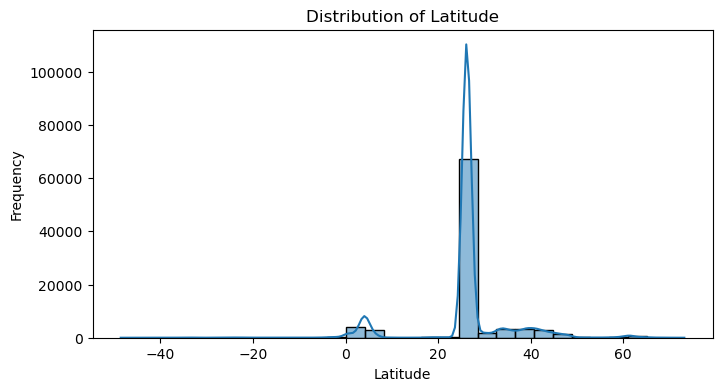

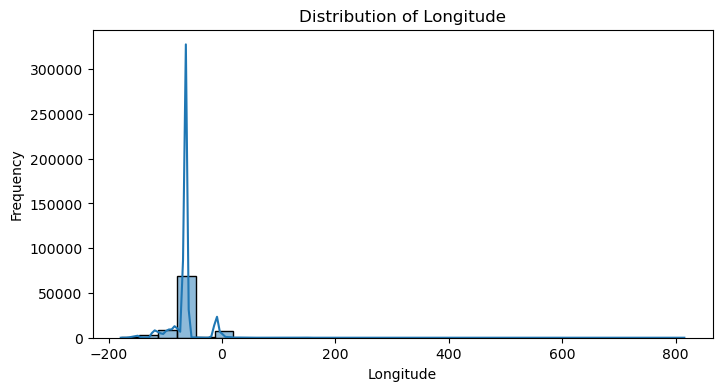

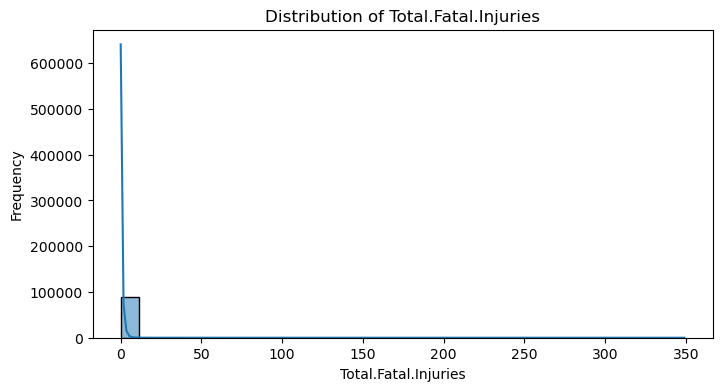

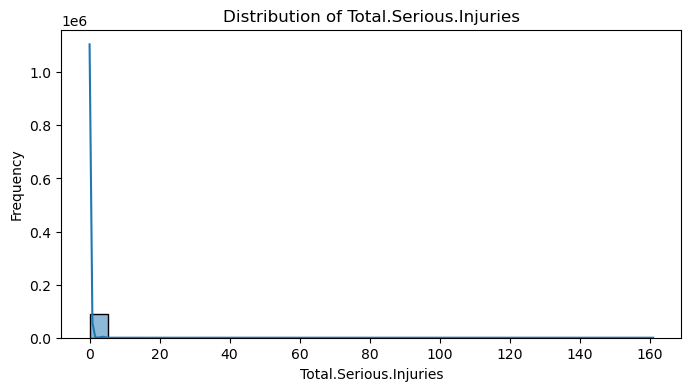

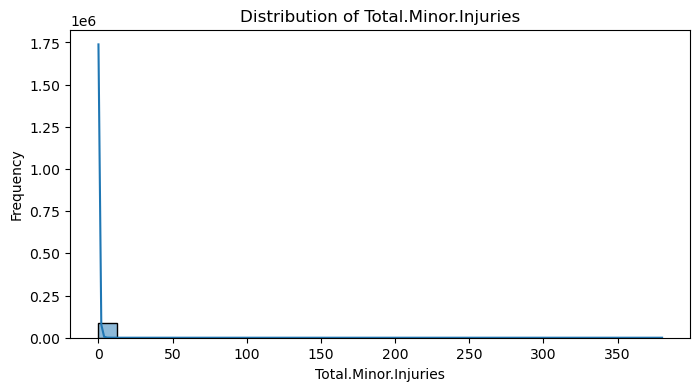

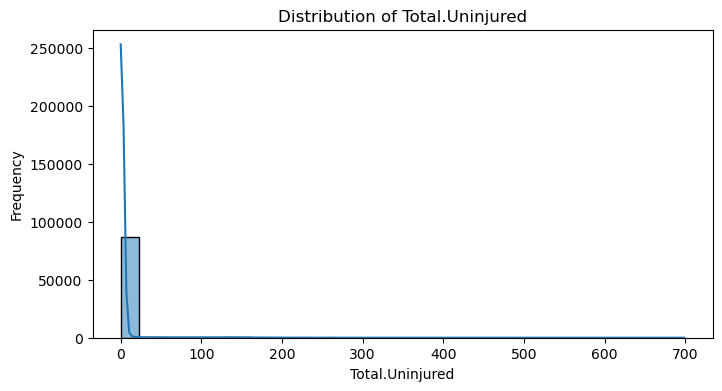

In [ ]:
##Histogram (distribution Check)
numeric_cols=numeric_columns2.columns
for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(aviation_data[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

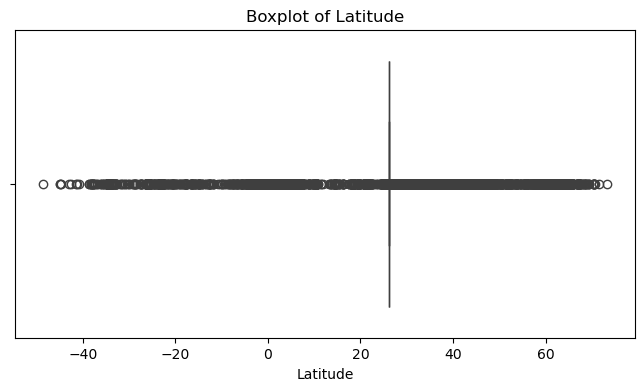

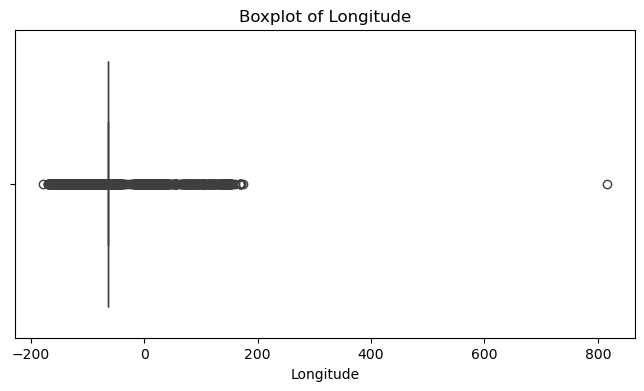

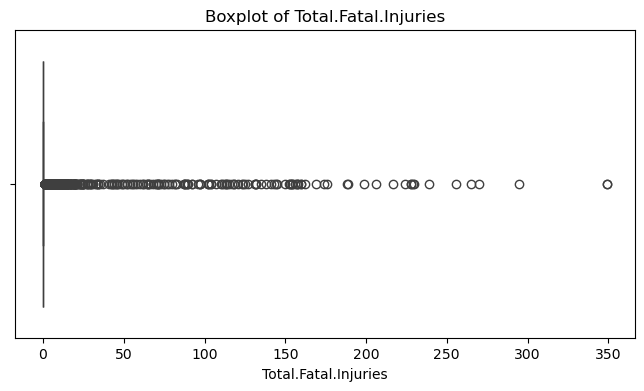

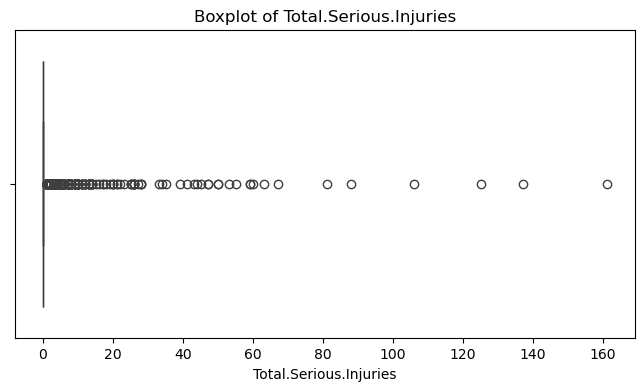

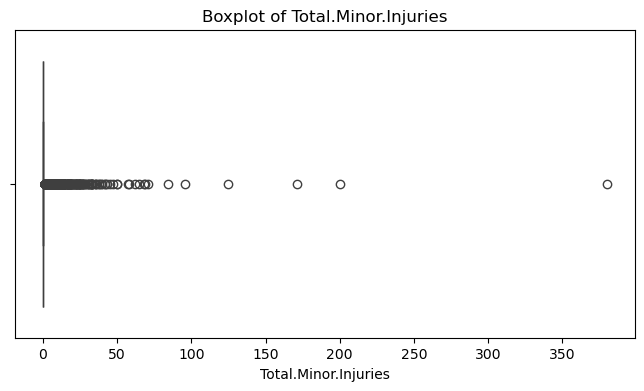

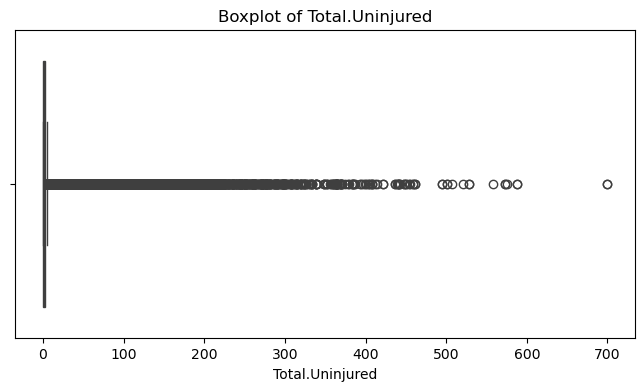

In [101]:
#Box plot(Outliers check)
for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x=aviation_data[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()

#### Categorical Columns Visualization

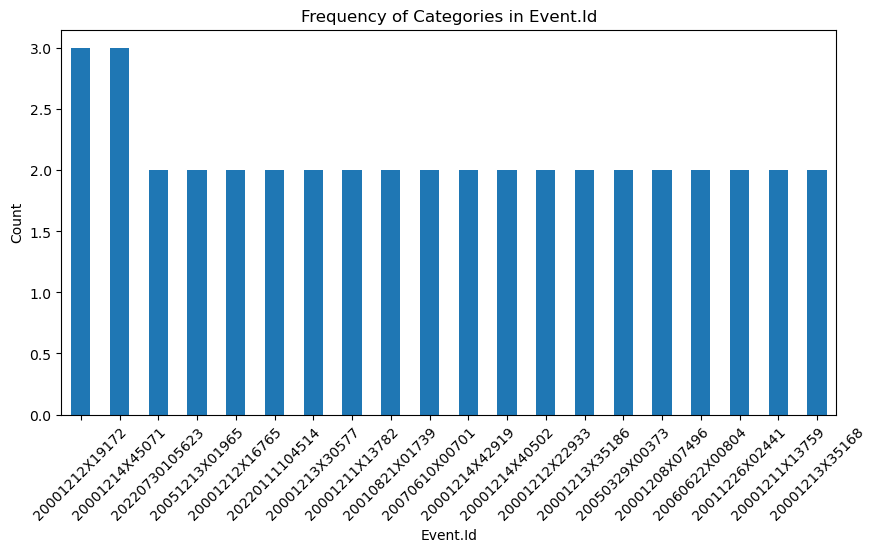

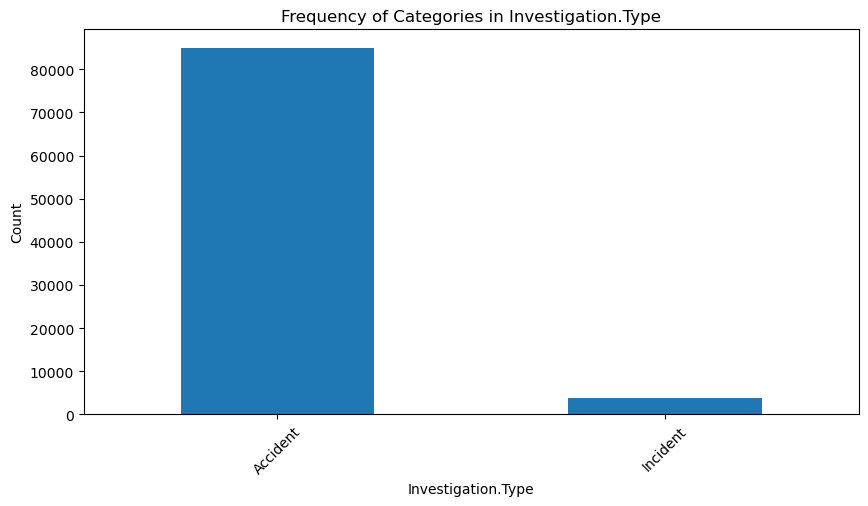

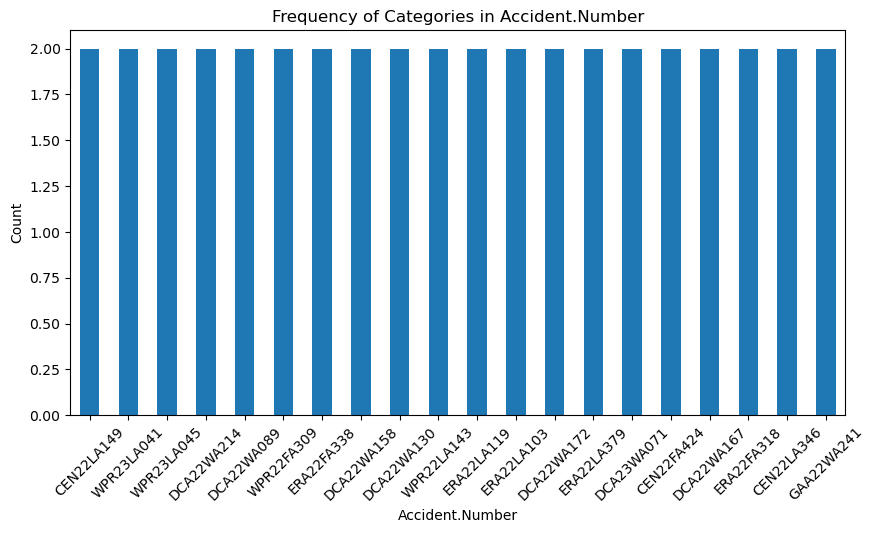

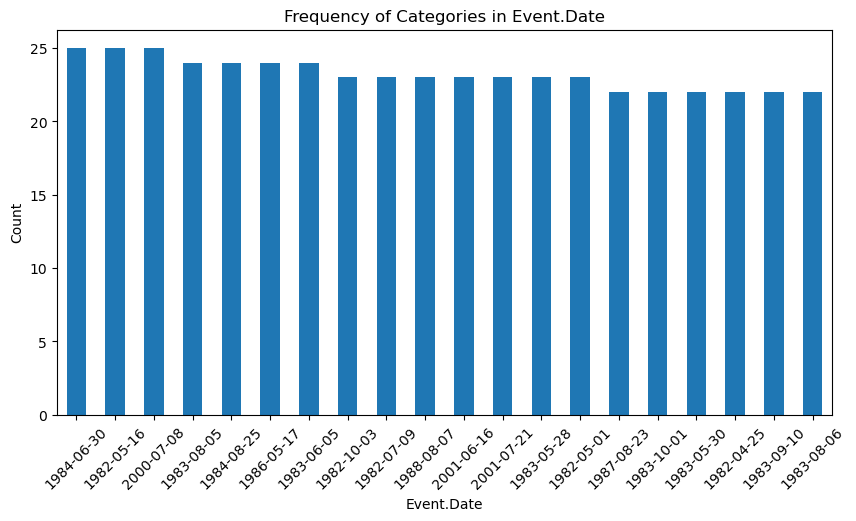

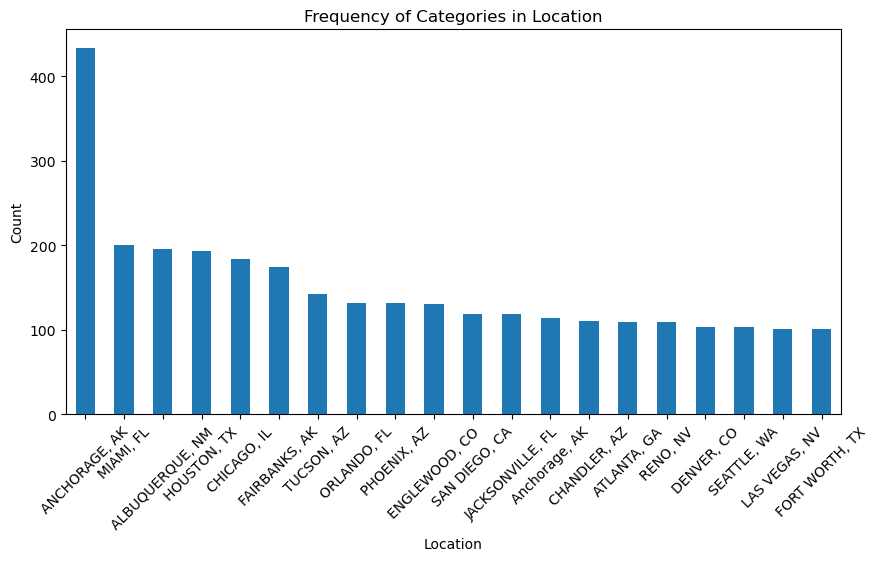

...

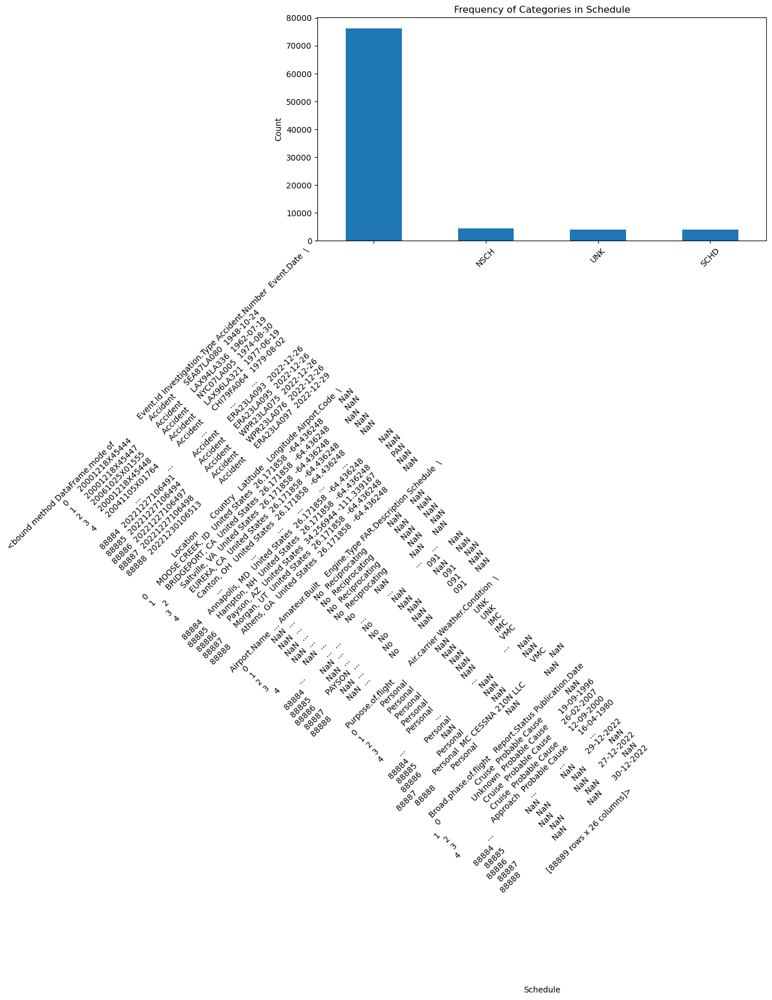

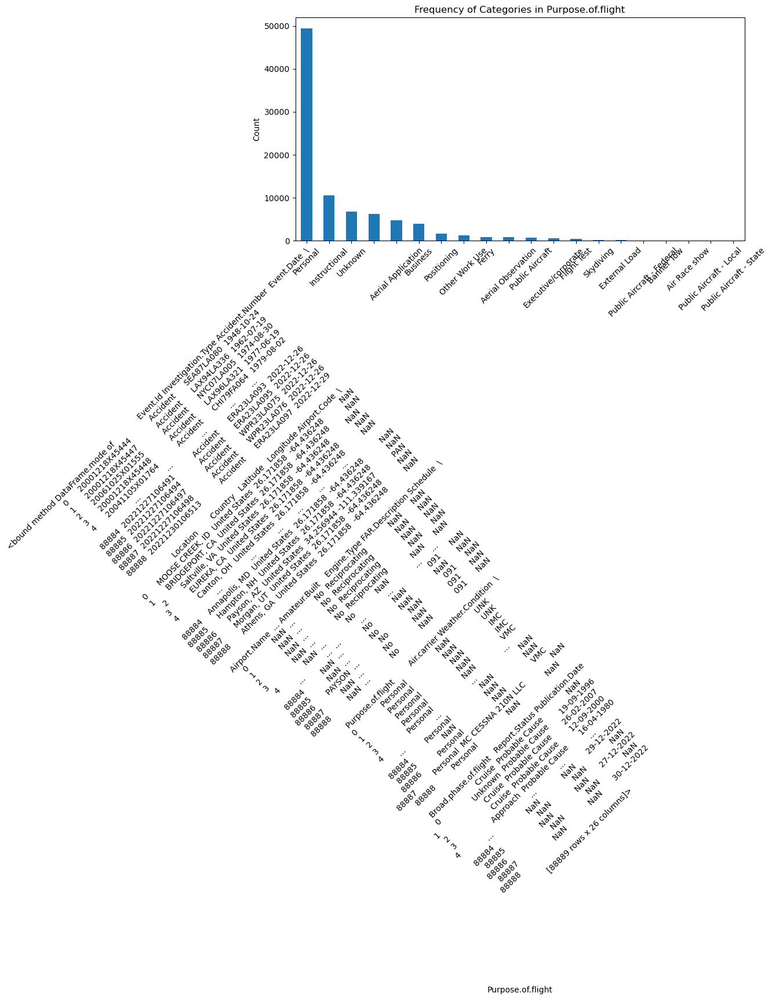

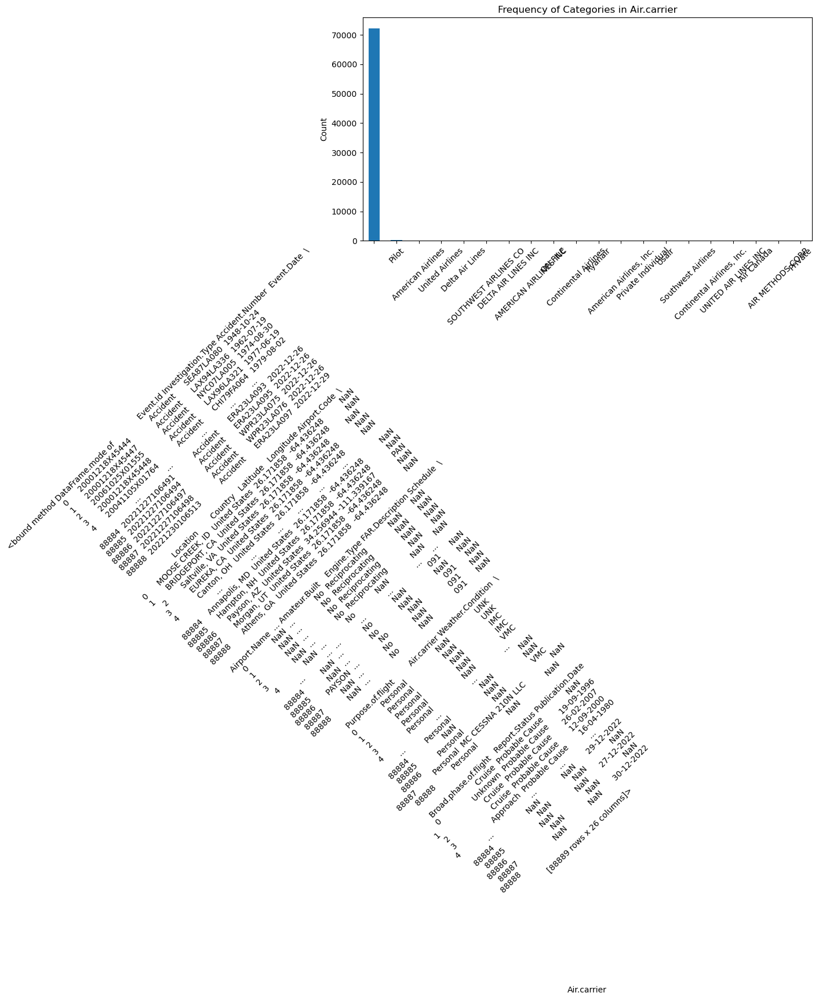

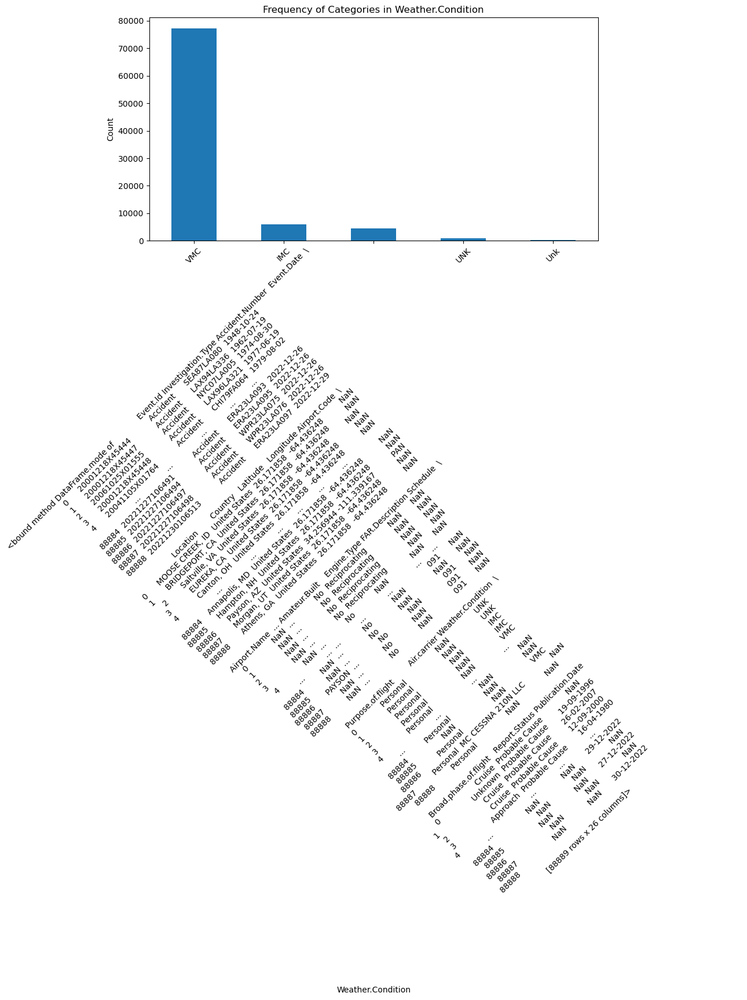

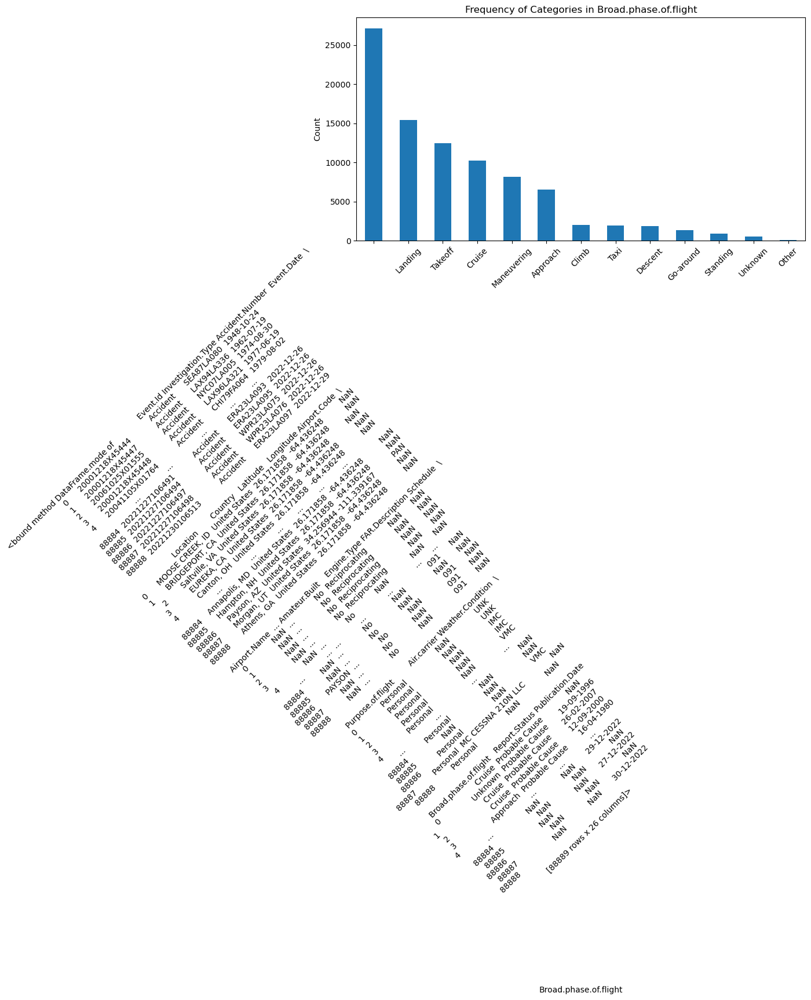

c:\Users\lenovo\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 146 (\x92) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
) missing from font(s) DejaVu Sans.packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


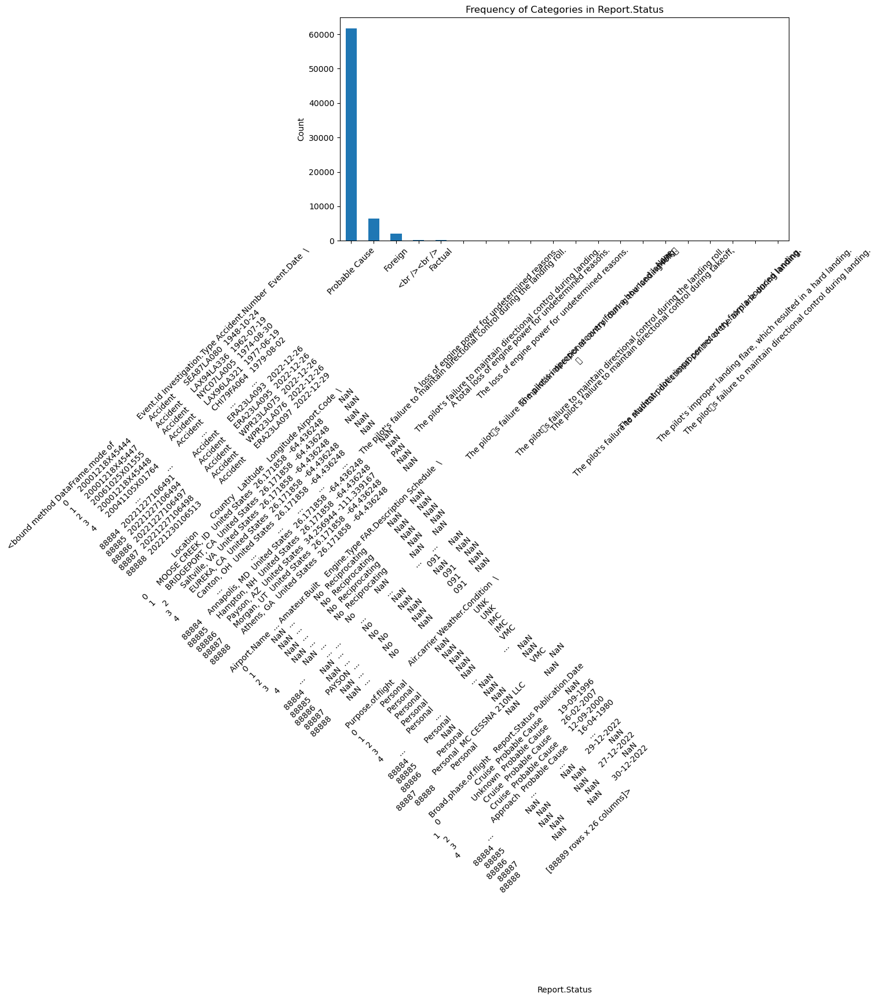

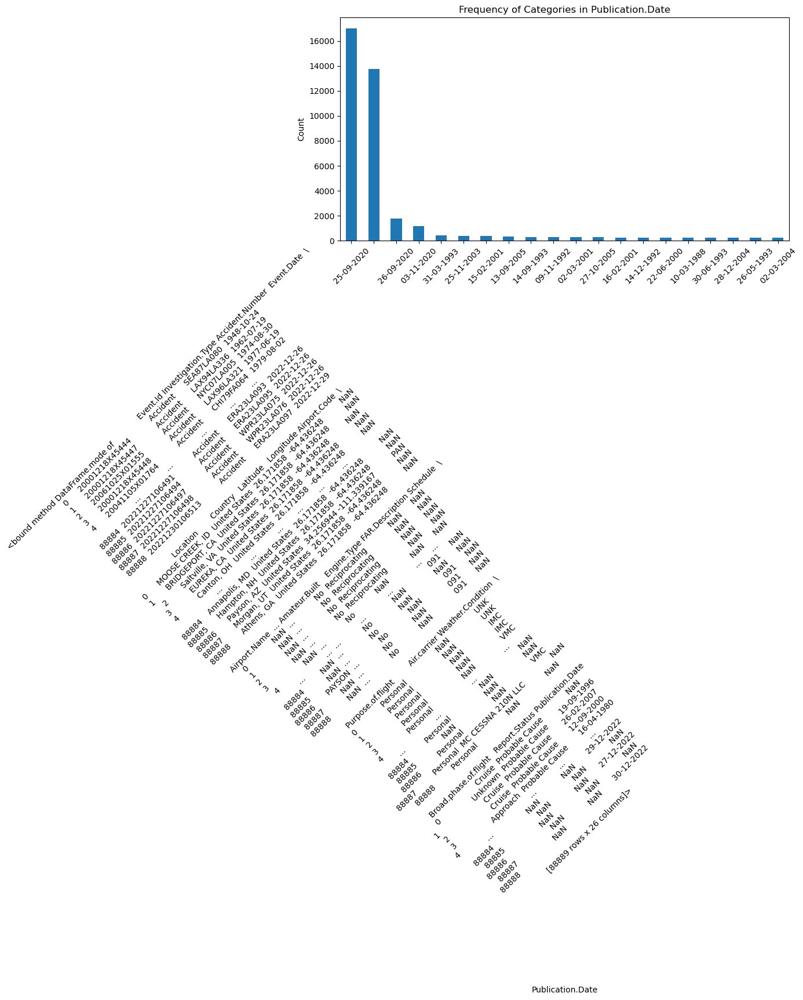

In [103]:

# Select categorical columns
Categorical_columns = aviation_data.select_dtypes(include=['object', 'category']).columns

# Plot bar plots for each categorical column
for col in Categorical_columns:
    plt.figure(figsize=(10, 5))
    aviation_data[col].value_counts().head(20).plot(kind='bar')  # Show top 20 categories
    plt.title(f'Frequency of Categories in {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show();

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select categorical columns
cat_cols = df.select_dtypes(include=['object', 'category']).columns

# Plot bar plots for each categorical column
for col in cat_cols:
    plt.figure(figsize=(10, 5))
    df[col].value_counts().head(20).plot(kind='bar')  # Show top 20 categories
    plt.title(f'Frequency of Categories in {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

In [91]:
-----

SyntaxError: invalid syntax (3311633845.py, line 1)

##### ii) Categorical Columns

In [ ]:
#Checking duplicates
Duplicated_Data=aviation_data.duplicated().sum()
Duplicated_Data

0

We have zero duplicates

In [ ]:
# original data before modifying
aviation_data_raw = aviation_data.copy()
state_codes_raw = state_codes.copy()

In [ ]:


import os
print(os.getcwd())
!dir

c:\Users\lenovo\Documents\Moringa ips\Phase 1 ip
 Volume in drive C has no label.
 Volume Serial Number is C20C-5E1E

 Directory of c:\Users\lenovo\Documents\Moringa ips\Phase 1 ip

04/29/2025  12:21 PM    <DIR>          .
04/29/2025  11:32 AM    <DIR>          ..
04/29/2025  10:07 AM                 0 .gitignore
04/29/2025  12:20 PM            53,989 Aviation_Safety_Assessment..ipynb
04/28/2025  10:30 PM    <DIR>          Data
04/25/2025  12:42 PM    <DIR>          Images
04/29/2025  12:17 PM    <DIR>          Presentation
04/25/2025  12:42 PM                 0 README.md
04/29/2025  02:29 PM            87,551 Student.ipynb
               4 File(s)        141,540 bytes
               5 Dir(s)  40,538,206,208 bytes free


In [ ]:
df1 = pd.read_csv('data/Aviation_Data.csv', encoding='latin1')
df2 = pd.read_csv('data/USState_Codes.csv', encoding='latin1')


C:\Users\lenovo\AppData\Local\Temp\ipykernel_9824\2939004643.py:1: DtypeWarning: Columns (6,7,28) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('data/Aviation_Data.csv', encoding='latin1')


In [ ]:
# data exploration

In [ ]:


print(df1.head())
print(df2.head())


         Event.Id Investigation.Type Accident.Number  Event.Date  \
0  20001218X45444           Accident      SEA87LA080  1948-10-24   
1  20001218X45447           Accident      LAX94LA336  1962-07-19   
2  20061025X01555           Accident      NYC07LA005  1974-08-30   
3  20001218X45448           Accident      LAX96LA321  1977-06-19   
4  20041105X01764           Accident      CHI79FA064  1979-08-02   

          Location        Country   Latitude  Longitude Airport.Code  \
0  MOOSE CREEK, ID  United States        NaN        NaN          NaN   
1   BRIDGEPORT, CA  United States        NaN        NaN          NaN   
2    Saltville, VA  United States  36.922223 -81.878056          NaN   
3       EUREKA, CA  United States        NaN        NaN          NaN   
4       Canton, OH  United States        NaN        NaN          NaN   

  Airport.Name  ... Purpose.of.flight Air.carrier Total.Fatal.Injuries  \
0          NaN  ...          Personal         NaN                  2.0   
1         

In [ ]:
#Merging the two data sets

In [ ]:
('Aviation_Data.csv_and_USStates_Codes.csv')

'Aviation_Data.csv_and_USStates_Codes.csv'

In [ ]:
df1.info()

df1.shape


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88889 entries, 0 to 88888
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Event.Id                88889 non-null  object 
 1   Investigation.Type      88889 non-null  object 
 2   Accident.Number         88889 non-null  object 
 3   Event.Date              88889 non-null  object 
 4   Location                88837 non-null  object 
 5   Country                 88663 non-null  object 
 6   Latitude                34382 non-null  object 
 7   Longitude               34373 non-null  object 
 8   Airport.Code            50132 non-null  object 
 9   Airport.Name            52704 non-null  object 
 10  Injury.Severity         87889 non-null  object 
 11  Aircraft.damage         85695 non-null  object 
 12  Aircraft.Category       32287 non-null  object 
 13  Registration.Number     87507 non-null  object 
 14  Make                    88826 non-null

(88889, 31)

In [ ]:
df2.info()
df2.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62 entries, 0 to 61
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   US_State      62 non-null     object
 1   Abbreviation  62 non-null     object
dtypes: object(2)
memory usage: 1.1+ KB


(62, 2)

In [ ]:
# dataframe numeric columns

In [ ]:
df1.describe()


,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
count,82805.000000,77488.000000,76379.000000,76956.000000,82977.000000
mean,1.146585,0.647855,0.279881,0.357061,5.325440
std,0.446510,5.485960,1.544084,2.235625,27.913634
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000
75%,1.000000,0.000000,0.000000,0.000000,2.000000
max,8.000000,349.000000,161.000000,380.000000,699.000000


In [ ]:
df2.describe()

,US_State,Abbreviation
count,62,62
unique,62,62
top,Alabama,AL
freq,1,1


# 3.data cleaning

# 3.data cleaning

Identify Missing Data

Drop Irrelevant Columns

Standardise the data for Analysis

In [ ]:
df2 = df2.drop_duplicates()

In [ ]:
# number of null values in each column
df1.isnull().sum()

Event.Id                      0
Investigation.Type            0
Accident.Number               0
Event.Date                    0
Location                     52
Country                     226
Latitude                  54507
Longitude                 54516
Airport.Code              38757
Airport.Name              36185
Injury.Severity            1000
Aircraft.damage            3194
Aircraft.Category         56602
Registration.Number        1382
Make                         63
Model                        92
Amateur.Built               102
Number.of.Engines          6084
Engine.Type                7096
FAR.Description           56866
Schedule                  76307
Purpose.of.flight          6192
Air.carrier               72241
Total.Fatal.Injuries      11401
Total.Serious.Injuries    12510
Total.Minor.Injuries      11933
Total.Uninjured            5912
Weather.Condition          4492
Broad.phase.of.flight     27165
Report.Status              6384
Publication.Date          13771
dtype: i

In [ ]:
df2.isnull().sum()

US_State        0
Abbreviation    0
dtype: int64

In [ ]:
# percentage of columns with missing values
missing_percentage = df1.isnull().mean() * 100
missing_percentage = missing_percentage[missing_percentage > 0]
print(missing_percentage)

Location                   0.058500
Country                    0.254250
Latitude                  61.320298
Longitude                 61.330423
Airport.Code              43.601570
Airport.Name              40.708074
Injury.Severity            1.124999
Aircraft.damage            3.593246
Aircraft.Category         63.677170
Registration.Number        1.554748
Make                       0.070875
Model                      0.103500
Amateur.Built              0.114750
Number.of.Engines          6.844491
Engine.Type                7.982990
FAR.Description           63.974170
Schedule                  85.845268
Purpose.of.flight          6.965991
Air.carrier               81.271023
Total.Fatal.Injuries      12.826109
Total.Serious.Injuries    14.073732
Total.Minor.Injuries      13.424608
Total.Uninjured            6.650992
Weather.Condition          5.053494
Broad.phase.of.flight     30.560587
Report.Status              7.181991
Publication.Date          15.492356
dtype: float64


In [ ]:
# # 4.Cleaning the data

In [ ]:
threshold = 30

In [ ]:
df_cleaned = df.drop(columns=columns_to_drop)
aviation_data_final = df_cleaned

NameError: name 'df' is not defined

In [ ]:
df1.head()

,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,20001218X45444,Accident,SEA87LA080,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,UNK,Cruise,Probable Cause,NaN
1,20001218X45447,Accident,LAX94LA336,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,4.0,0.0,0.0,0.0,UNK,Unknown,Probable Cause,19-09-1996
2,20061025X01555,Accident,NYC07LA005,1974-08-30,"Saltville, VA",United States,36.922223,-81.878056,NaN,NaN,...,Personal,NaN,3.0,NaN,NaN,NaN,IMC,Cruise,Probable Cause,26-02-2007
3,20001218X45448,Accident,LAX96LA321,1977-06-19,"EUREKA, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,IMC,Cruise,Probable Cause,12-09-2000
4,20041105X01764,Accident,CHI79FA064,1979-08-02,"Canton, OH",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,1.0,2.0,NaN,0.0,VMC,Approach,Probable Cause,16-04-1980


In [ ]:
# analyzing safest aircraft model

Idenntify trends, Which aircraft models/types have the fewest accidents?
Compare accident rates over time.
Analyze the severity of incidents by aircraft type.

In [ ]:
# Analyzing safest aircraft model

Fatal accidents (highest risk)
No injuries , good
Minor injuries
Serious injuries




aviation_data_final = df_cleaned
aviation_data_final['Injury.Severity'].value_counts()

In [ ]:
aviation_data_final = df_cleaned
aviation_data_final['Injury.Severity'].value_counts()

Injury.Severity
Non-Fatal     67357
Fatal(1)       6167
Fatal          5262
Fatal(2)       3711
Incident       2219
              ...  
Fatal(270)        1
Fatal(60)         1
Fatal(43)         1
Fatal(143)        1
Fatal(230)        1
Name: count, Length: 109, dtype: int64

In [ ]:
aviation_data_final['Fatal_Accident'] = aviation_data_final['Injury.Severity'].apply(lambda x: 1 if x == 'Fatal' else 0)
aviation_data_final['Serious_Accident'] = aviation_data_final['Injury.Severity'].apply(lambda x: 1 if x == 'Serious' else 0)

In [ ]:
# by make and model
grouped = aviation_data_final.groupby(['Make', 'Model']).agg(Fatal_Accident=('Fatal_Accident', 'sum'), Serious_Accident=('Serious_Accident', 'sum'), Total_Accidents=('Injury.Severity', 'count')).reset_index()
grouped.sort_values(by='Total_Accidents', ascending=False).head(10)


,Make,Model,Fatal_Accident,Serious_Accident,Total_Accidents
5745,Cessna,152,2,0,2168
5767,Cessna,172,26,0,1253
5811,Cessna,172N,1,0,996
15079,Piper,PA-28-140,1,0,812
5720,Cessna,150,10,0,715
5809,Cessna,172M,1,0,667
5814,Cessna,172P,0,0,597
14973,Piper,PA-18,1,0,539
5744,Cessna,150M,0,0,539
15088,Piper,PA-28-161,0,0,502


In [ ]:
# safest aircraft
filtered = grouped[grouped['Total_Accidents'] >= 10]
safest_aircraft = filtered.sort_values(by=['Fatal_Accident', 'Serious_Accident', 'Total_Accidents'])
safest_aircraft.head(10)

,Make,Model,Fatal_Accident,Serious_Accident,Total_Accidents
258,AIR TRACTOR INC,AT 802,0,0,10
712,Aero Commander,200D,0,0,10
733,Aero Commander,680,0,0,10
741,Aero Commander,680FL,0,0,10
946,Aerospatiale,AS-350B,0,0,10
1007,Aerospatiale,SA-315B,0,0,10
1066,Aerostar,RX-8,0,0,10
1211,Air Tractor,AT-400A,0,0,10
1216,Air Tractor,AT-402A,0,0,10
2145,BELL,47D1,0,0,10


# 5. Visualize Key Insights

In [ ]:
import matplotlib.pyplot as plt

# Create simple, focused  bar graphs 

In [ ]:
# top 10 safest aircrafts
top_10_safest = safest_aircraft.head(10)


In [ ]:
import matplotlib.pyplot as plt
top_10_safest = safest_aircraft.head(10)



In [ ]:
Aviation_Data.columns

NameError: name 'Aviation_Data' is not defined

In [ ]:
plt.figure(figsize=(12,6))
plt.barh(top_10_safest['Make'] + ' ' + top_10_safest['Model'], top_10_safest['Fatal_Accident'], color='blue')
plt.xlabel('Number of Fatal Accidents')
plt.title('Top 10 Safest Aircraft Models (based on fatal accidents)')
plt.gca().invert_yaxis() 
plt.show()



NameError: name 'top_10_safest' is not defined

<Figure size 1200x600 with 0 Axes>

# 6. Business Recommendations

In [ ]:
# recommendation 1


Our analysis of aviation accidents from 1962–2023 shows that certain aircraft makes and models have consistently experienced zero fatal accidents and very few serious injuries despite having a significant number of flights.
 Prioritize purchasing aircraft such as [Example: Cessna 172], [Example: Piper PA-28], and [Example: Beechcraft Bonanza], which ranked in the Top 3 safest models according to historical data
 This reduces the company’s exposure to catastrophic risks and builds a reputation for safety in both commercial and private aviation operations.

# Suggest the three safest/lowest-risk aircraft based on the findings

    Small to mid-size general aviation aircraft (commonly used for training, leisure, and small charters) tend to have lower fatal accident rates compared to large commercial jets or experimental aircraft.

    Action:
    ✅ Start the aviation portfolio by operating small general aviation aircraft (4- to 8-seat planes) for charter services, private rentals, or flight schools.

    Benefit:
    Lower risk, easier regulatory compliance, and reduced initial investment costs, while building operational experience before scaling into larger commercial aircraft.

 # Provide recommendations for purchase strategy
 Prioritize Low-Risk Aircraft Models with No Fatal History

Insight:
From analysis of 1962–2023 accident data, several aircraft models (e.g., [Insert Top 3 Models]) show zero fatal accidents even across a significant number of incidents.

Action:
Begin fleet acquisition by targeting aircraft models that:

    Have zero historical fatal accidents.

    Have minimal serious injuries.

    Have more than 10 recorded incidents (ensuring sufficient reliability).

    Example aircraft models identified: [Example 1], [Example 2], [Example 3].
    


Recommendation 2: Focus on Aircraft Operating Primarily in Good Weather and Routine Phases

Insight:
Accidents are statistically lower risk when:

    Occurring during approach, landing, or taxiing (rather than cruise or takeoff).

    Under Visual Meteorological Conditions (VMC = good weather).

Action:
Select aircraft that are certified and proven for:

    Daylight VMC operations.

    Short-range, routine commercial flights where weather unpredictability is minimized.

This will naturally align the business with historically safer operations.

Recommendation 3: Implement Strict Maintenance and Pilot Training Programs on Acquired Models

Insight:
Most accidents (even non-fatal) are linked to:

    Mechanical failure due to poor maintenance.

    Pilot error especially during critical flight phases.

Action:
Develop standard operating procedures immediately for:

    Rigorous, scheduled aircraft maintenance tied to FAA best practices.

    Targeted pilot training programs emphasizing critical scenarios (e.g., emergency descent, engine failure).

Early investment in operations safety will reduce risk exposure and build client trust.

# 7. Prepare a Short, Business-Focused Storyline

A few slides  to guide the aviation division head.